#Importing all the necessary packages

In [ ]:
!pip install tensorflow==2.8.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 93.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 41.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 81.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 73.5 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.7.0
    Uninstalling tensorboard-data-server-0.7.0:
      Successfully uninstalled tensorboard-data-server-0.7.0
  Attempting uninstall: google-auth-oauthlib
    Fo

In [ ]:
import zipfile, os
import shutil
import math
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
import tensorflow.keras.utils

###Extracting the zip folder

In [ ]:
#extrac the zip file downloaded
zip_ref = zipfile.ZipFile('archive (9).zip', 'r')
zip_ref.extractall()

KeyboardInterrupt: ignored

In [ ]:
#extrac the zip file downloaded
zip_ref = zipfile.ZipFile('val_data.zip', 'r')
zip_ref.extractall()

###Mount the drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###The input pictures are stored as JPG file in the Train/ folder (such as Train/1353343.jpg), and the corresponding segmentation mask is stored as a jpg file with the same name in the Masked/ folder (such as MaskedData/Masked/1353343.jpg).

###Now, what does one of these inputs and its mask look like? Let’s take a quick look.

###Let's take a look at an input image in the images directory.We use load_img to convert the image into an array and imshow to display it.

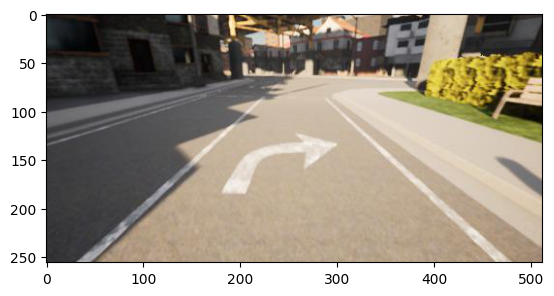

In [ ]:
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img

plt.axis("on")
plt.imshow(load_img("/content/TrainData/Train/1353343.jpg"))

###Now let's take a look at mask for the same picture. since the mask values are 1,2, and 3, we only have a signle channel in the output. We use color_mode='grayscale' so that the image we load is treated as having a single color channel.

---



---



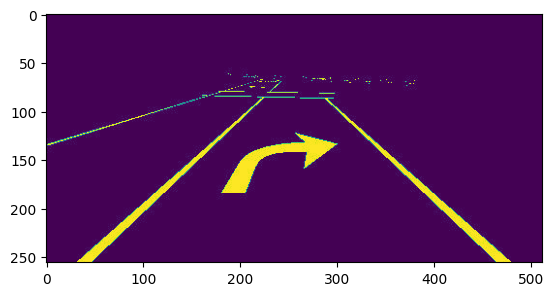

In [ ]:
import numpy as np
plt.imshow(load_img("/content/MaskedData/Masked/1353343.jpg", color_mode="grayscale"))

###* We use <code>globe</code> function to get a list of image pathnames in *TrainData/train* directory and a list of mask pathnames in *MaskedData/Masked* directory. We sort these lists to make sure that the pathnames in image_files correspond to pathnames in  mask_files.
###*  We use <code>tf.data.Dataset.from_tensor_slices((image_files, mask_file))</code> to create a dataset containing tuples of the form (image_path,mask_path) for each image and its mask.  In general <code>from_tensor_slices</code> can be used to construct a tf.data.Dataset object from the data in memory ( e.g., a numpy array or a dataframe)


In [ ]:
from glob2 import glob
import tensorflow as tf

#get a lis of image pathnames in dataset/images/img folder
image_files = sorted(glob('/content/TrainData/Train/*.jpg'))

# get a list of mask pathnames in dataset/masks/img folder
mask_files = sorted(glob('/content/MaskedData/Masked/*.jpg'))

val_files = sorted(glob('//content/val_data/*.jpg'))

print("number of images:", len(image_files))
print("number of masks:", len(mask_files))
print("number of valid images:", len(val_files))

#create a dataset containing tuples of the form (image_path, mask_path)
files_ds = tf.data.Dataset.from_tensor_slices((image_files, mask_files))

number of images: 6000
number of masks: 6000
number of valid images: 1320


###The function normalizes the input_image based on its type.

###If the "type" argument is "mask", the function subtracts 1 from the input_image. This is done to normalize the mask labels so that they start from 0 instead of 1. For example, if the mask labels are 1, 2, and 3, subtracting 1 from each label would convert them to 0, 1, and 2, respectively.

###If the "type" argument is not "mask", the function normalizes the input_image by dividing its pixel values by 255. This is done to scale down the pixel values to a range of 0 to 1, which is commonly used in deep learning applications. The tf.cast() function is used to convert the input_image to a float32 data type, which is the most commonly used data type in deep learning models.

###Overall, the purpose of this function is to preprocess the input images before they are used for training a deep learning model. This normalization step is often necessary to improve the performance of the model and reduce the training time.

In [ ]:
def normalize(input_image, type):

  # if this is a mask, normalize it by subtracting 1 so that the labels are 0,1,2 instead of 1,2,3
  if type=="mask":
    return input_image-1
  else:
    #normalize the image as usual by dividing its pixels by 255.
    return tf.cast(input_image, tf.float32) / 255.0


###The given code defines a function named "process_image" that takes two arguments: "image_path" and "type".

###The function loads an image from the given "image_path" using the TensorFlow IO library's "tf.io.read_file" function.

###The "type" argument is used to decide whether to decode the image as a JPEG or PNG format. If the "type" argument is not "mask", the function decodes the image using "tf.image.decode_jpeg" function, which is used for JPEG images. Otherwise, if the "type" argument is "mask", the function decodes the image using the "tf.image.decode_png" function, which is used for PNG images with an alpha channel.

###After decoding the image, the function resizes it to a fixed size of (160,160) pixels using the "tf.image.resize" function. This resizing step ensures that all images have the same dimensions, which is often required for deep learning models.

###Finally, the function calls the "normalize" function to normalize the pixel values of the image. If the "type" argument is "mask", the "normalize" function subtracts 1 from the image to convert the label values to start from 0. Otherwise, the "normalize" function divides the pixel values by 255 to scale them to a range of 0 to 1.

###The function returns the normalized image as a tensor. This preprocessed image can then be used as an input to a deep learning model for training or inference.

In [ ]:
def process_image(image_path, type):
    # load the image from the path

    img = tf.io.read_file(image_path)
    #print(img)
    #decode the image to tensor. If this is a mask use decode_png otherwise use decode_jpeg
    img = tf.image.decode_jpeg(img, channels=3) if type!="mask" else tf.image.decode_jpeg(img,channels=3)

    #resize all images to the same height and width (160,160)
    img = tf.image.resize(img, size=(160, 160))

    #call normalize
    img= normalize(img, type)

    return img

###The "map" function is a higher-order function in TensorFlow that applies a given function to each element in a dataset and returns a new dataset containing the results. In this case, the "map" function applies a lambda function to each element in "files_ds", where the lambda function takes two arguments: "img" and "mask", which represent the image and mask paths, respectively.

###For each element in "files_ds", the lambda function applies the "process_image" function to the image and mask paths using the "type" argument. The "type" argument is set to "img" for the image path and "mask" for the mask path, which determines how the image and mask are decoded and normalized by the "process_image" function.

###The resulting preprocessed images and masks are returned as a tuple and collected in a new dataset named "ds". The preprocessed images and masks in "ds" can then be used for training a deep learning model.

In [ ]:
#calls the process_image on each image_path and mas_path in files_ds
ds= files_ds.map( lambda img, mask: (process_image(img,type="img"), process_image(mask,type="mask")))

In [ ]:
print(ds)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None))>


###As we can see from the above results at shpae matches (160,160,3) with (160,160,3)

In [ ]:
val_size = int(len(image_files) * 0.2)
train_ds = ds.skip(val_size)
val_ds = ds.take(val_size)

In [ ]:
#print(train_ds)

<SkipDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None))>


tf.Tensor([256 512   1], shape=(3,), dtype=int32)


Unique(y=<tf.Tensor: shape=(68,), dtype=uint8, numpy=
array([  0,   1,  10,  14,   4,  12,   5,   2,  16,  11,   9,  13,  15,
         7,   8,  19,   3,  20, 255, 249, 242,   6, 246,  22, 252, 234,
       241, 250,  17,  18, 254,  31,  27, 244, 245, 251,  26,  23,  28,
       235, 236, 248,  24, 230, 239, 223, 243, 253,  21, 247,  35,  29,
        25, 238, 240, 237, 232,  32, 226, 228, 219, 233, 229, 231, 227,
        33,  37, 217], dtype=uint8)>, idx=<tf.Tensor: shape=(131072,), dtype=int32, numpy=array([0, 0, 0, ..., 0, 0, 0], dtype=int32)>)

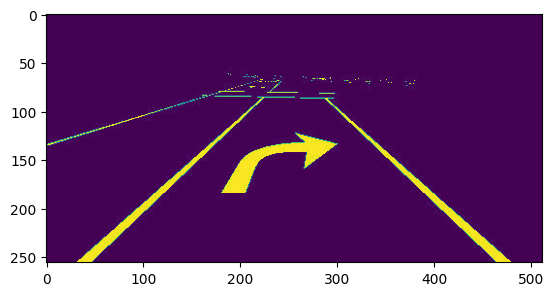

In [ ]:
#Added by Buxton for checking the values in the masked image
#mask=process_image('/content/MaskedData/Masked/1353343.jpg', type="mask")
mask = tf.io.read_file('/content/MaskedData/Masked/1353343.jpg')
mask=tf.image.decode_jpeg(mask,channels=1)
print(tf.shape(mask))

plt.imshow(tf.keras.utils.array_to_img(mask))
tf.unique(tf.reshape(mask,[-1]))

###Now we need to transform the pathnames in files_ds dataset to the actual image tensors and mask tensor so we can feed it to our model. To do this, we first define a function <code>process_image</code> that reads each image, decodes it to a numeric tensor of shape (width, height, channel) , resizes ithe height and width to (180,180) and normalizes it.  

###The normalization is different for the images and their masks. Each value in an image represents a pixel intensity and images are normalized by dividing the pixels by 255.0 as usual.  

###In contrast, every value in mask represents a class label (1: foreground, 2:background, and 3:contour). Since label indices should start from zero instead of one, we normalize the mask by subtracting one so that our labels become 0,1,2.


### Finally, we apply the <code>process_image</code> function above to each element of file_ds using <code>file_ds.map</code> to transform tuples of the form (image_path, mask_path) to (image_tensor, mask_tensor)

###Before training the model we need to split the dataset into train and validation sets. We use 20% of the images ( that is, int(len(image_files) * 0.2) for validation and the rest for training. ds.take(val_size) returns the first val_size examples in the dataset and ds.skip returns all examples except the first val_size examples.

In [ ]:
train_ds=train_ds.batch(32)
train_ds=train_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.batch(32)
val_ds=val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
train_ds

### "DenseNet121" architecture from the Keras Applications module, which is a pre-trained deep learning model that is trained on the ImageNet dataset for image classification.

###The "DenseNet121" model is instantiated with the "weights" parameter set to "imagenet" to load the pre-trained weights for the model. The "include_top" parameter is set to "False" to exclude the fully connected layers at the top of the network, which will be replaced by new layers for the lane segmentation task. The "input_shape" parameter is set to (160,160,3), which is the size of the input images expected by the model.

###Next, the code sets the "trainable" attribute of the convolutional base to "False" to freeze the pre-trained weights of the model. By freezing the weights of the convolutional base, the model will not modify the weights during training, and only the new layers added on top of the convolutional base will be trained.

###Finally, the we will call the "summary" method on the "conv_base" model to print a summary of its architecture.
###Overall, the purpose  is to load a pre-trained DenseNet121 model with the weights trained on the ImageNet dataset, freeze its weights, and prepare it as a convolutional base for a new model that will be trained for the lane segmentation task.






In [ ]:
from matplotlib import pyplot as plt
for image,mask in train_ds.take(1):
  print(type(image[0]))
  plt.imshow(tf.keras.utils.array_to_img(image[0]))
  plt.show()
  plt.imshow(tf.keras.utils.array_to_img(mask[0]))
  break



In [ ]:
from tensorflow.keras.applications import DenseNet121
conv_base = DenseNet121(weights='imagenet',
include_top=False,
input_shape=(160,160, 3))

#freeze the weight of the convolutional base
conv_base.trainable=False

# get the summary of the model to view its architecture
conv_base.summary()

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 166, 166, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 80, 80, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                        

###The summary shows the number of layers in the model, the size of the output tensor at each layer, and the number of trainable and non-trainable parameters in the model.


###First, lets creates a variable "num_classes" with the value of 3, which represents the number of classes for lane segmentation.

###Then, we will add a new convolutional layer  to the output of the pre-trained DenseNet121 model using the "Conv2D" layer from Keras. This layer has a kernel size of (1,1), which means it will apply a 1x1 convolution to the output feature maps of the pre-trained model. The "padding" parameter is set to "same" to ensure that the output feature maps have the same size as the input feature maps. The "activation" parameter is set to "relu" to introduce non-linearity in the output feature maps.

###Next, we will add "Conv2DTranspose" layer to the model. This layer is used for upsampling the output feature maps from the previous convolutional layer to the original input image size. The "kernel_size" parameter is set to 64 to define the size of the upsampling kernel. The "strides" parameter is set to 32 to define the upsampling factor. The "padding" parameter is set to "same" to ensure that the output feature maps have the same size as the input feature maps. The "activation" parameter is set to "softmax" to ensure that the output feature maps represent probability distributions over the lane classes.

###Finally, a new Keras model will be instantiated with the inputs from the pre-trained DenseNet121 model and the output from the "Conv2DTranspose" layer.

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow import keras
from tensorflow.keras import layers

num_classes=3
x=layers.Conv2D(num_classes,kernel_size=(1,1), activation="relu", padding="same")(conv_base.output)
output=layers.Conv2DTranspose(num_classes,kernel_size=64,activation="softmax", strides=32, padding="same" )(x)
model = keras.Model(conv_base.input, output)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 166, 166, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 80, 80, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                            

###The model is printed with the "summary" method to show the architecture of the new model, which includes the pre-trained DenseNet121 model as the convolutional base, followed by the newly added convolutional and upsampling layers for lane segmentation.

In [ ]:
print(train_ds)

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32, name=None))>


In [ ]:
from tensorflow import keras
import tensorflow as tf
import math

train_size=5912
validation_size=1478
batch_size=64

#configuring and compiling the model

model.compile(optimizer="rmsprop", loss="categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("lane_segmentation",save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, min_delta=1e-3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)
]

history = model.fit(
                    train_ds,
                    epochs=100,
                    validation_data=val_ds,
                    callbacks=callbacks,
                    )




Epoch 1/100
150/150 [==============================] - 55s 307ms/step - loss: 23.0245 - val_loss: 37.0679 - lr: 0.0010
Epoch 2/100
150/150 [==============================] - 11s 71ms/step - loss: 23.6524 - val_loss: 37.6672 - lr: 0.0010
Epoch 3/100
150/150 [==============================] - 10s 70ms/step - loss: 24.2897 - val_loss: 38.4107 - lr: 0.0010
Epoch 4/100
150/150 [==============================] - 11s 70ms/step - loss: 24.7348 - val_loss: 38.7004 - lr: 0.0010
Epoch 5/100
150/150 [==============================] - 11s 71ms/step - loss: 24.4592 - val_loss: 38.2769 - lr: 0.0010
Epoch 6/100
150/150 [==============================] - 11s 73ms/step - loss: 24.0677 - val_loss: 38.0261 - lr: 0.0010


###This code is training the previously defined model using the fit() method in Keras. The model is compiled with the RMSprop optimizer and categorical crossentropy loss function.
###The training data is passed to the train_ds variable, which should be a dataset object containing the training data. The number of epochs is set to 100, which means that the model will be trained for 100 iterations over the entire training dataset.

###The validation data is passed to the val_ds variable, which should be a dataset object containing the validation data. The model will be evaluated on this data after each epoch.

###The callbacks parameter is a list of Keras callbacks that will be used during training. These callbacks include:

###ModelCheckpoint: This callback will save the model weights to a file whenever the validation loss improves.
###EarlyStopping: This callback will stop training if the validation loss does not improve for a specified number of epochs (patience).
###ReduceLROnPlateau: This callback will reduce the learning rate if the validation loss does not improve for a specified number of epochs (patience).
###Finally, the fit() method is called on the model object with the specified training and validation datasets, as well as the callbacks. The history variable will contain the training and validation loss and accuracy values for each epoch.

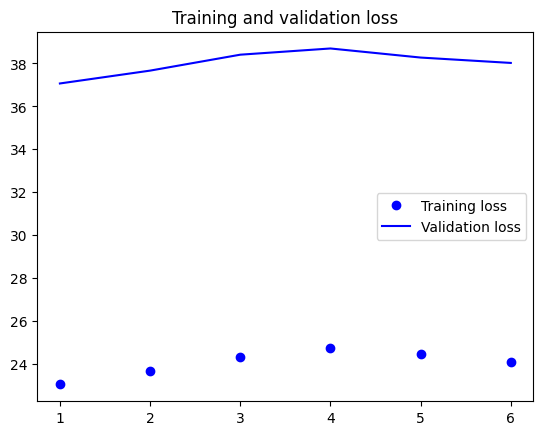

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()

###Lets loads a checkpointed model using keras.models.load_model and then use this model to make predictions on a batch of images from the validation dataset.

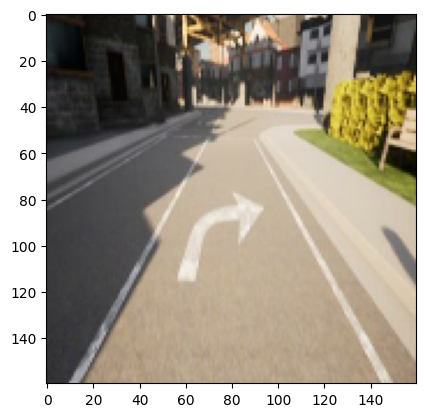

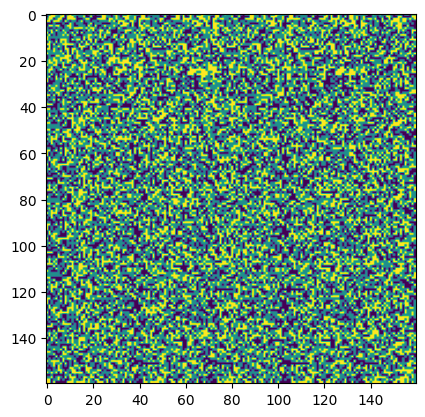

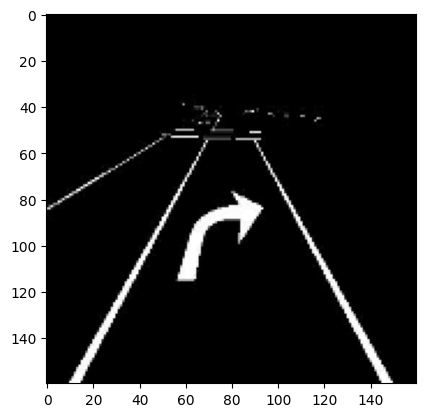

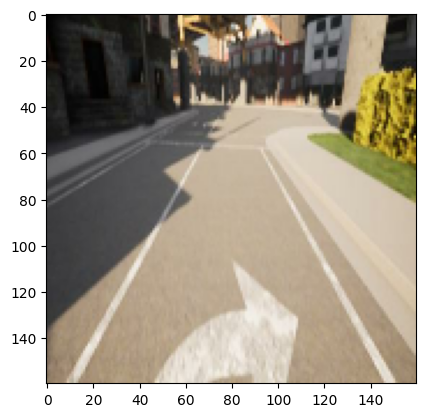

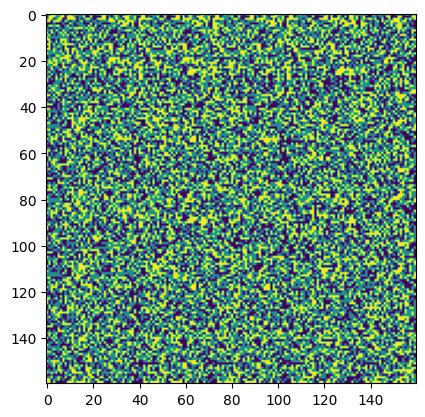

...

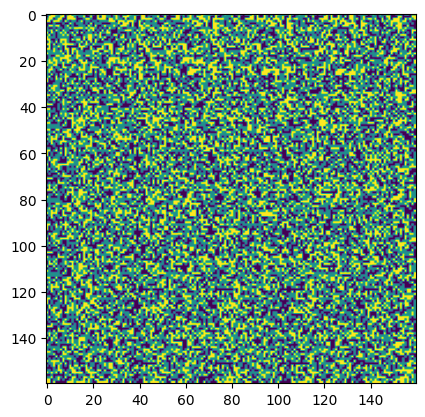

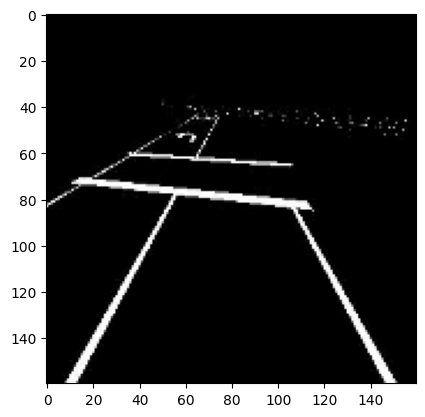

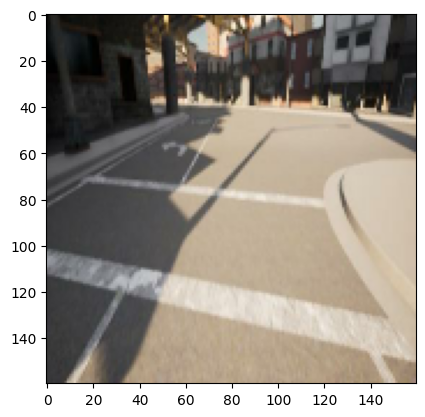

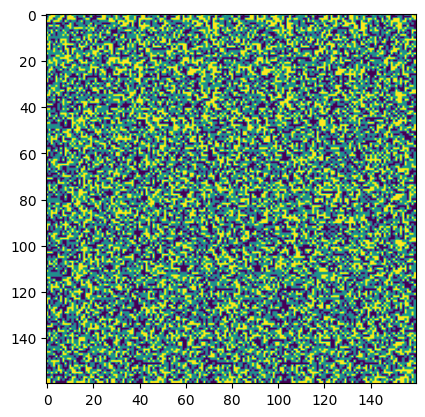

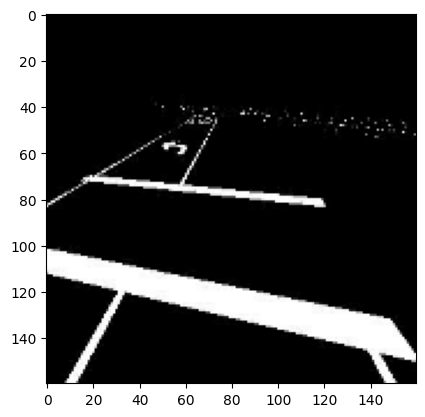

In [ ]:
import numpy as np

#load the checkpointed model
checkpoint_model=keras.models.load_model("lane_segmentation")

for x,y in val_ds.take(1):
  #use the model to predict pixel mask for the images in x
  preds = checkpoint_model.predict(x)

  #display the first five images in the batch together with their true mask and predicted mask
  for img,pred,true_mask in zip(x[:5],preds[:5],y[:5]):
    plt.imshow(tf.keras.utils.array_to_img(img))
    plt.show()

  #model's prediction for each image is of shape (160,160,3). The last axis holds the probability distribution over three pixel classes.
  #To display the output, we convert it to a single channel by taking the class with maximum predicted probability
    predicted_mask = np.argmax(pred, axis=-1)
  # shoe predicted mask
    plt.imshow(tf.keras.utils.array_to_img(tf.expand_dims(predicted_mask,-1)))
    plt.show()

  #show true mask
    plt.imshow(tf.keras.utils.array_to_img(true_mask))
    plt.show()




###For each image in the batch, the model's prediction is a pixel-wise probability distribution over three classes. The code converts this output to a single-channel mask by taking the class with the maximum predicted probability using np.argmax. For the first five images in the batch, the code displays the original image, the predicted mask, and the true mask side by side using tf.keras.utils.array_to_img and matplotlib.pyplot.imshow.

###Lets unfreeze the weights of the convolutional base of the previously trained model. It sets trainable attribute to True for all layers except the last 9 layers.

In [ ]:
#unfreez the convolution base
conv_base.trainable = True

#set trainable to False for all layers except the last 9 , that is freeze the weights for all layers except the last 9 layers
for layer in conv_base.layers[:-9]:
    layer.trainable=False

#set trainable to True for the convolutional layhers in the last 9 layers ( the last convolutional block in DENSENET121). That is unfreez the weights for the last 9 layers
for layer in conv_base.layers[-9:]:
    # we only want to unfreez the convolutional layers (batch normalizataion layers remain frozen)
    if layer.name.endswith("conv"):
      layer.trainable=True

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 166, 166, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 80, 80, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                            

###Lets compile and fit the model after unfreezing the convolution base and setting different layers to trainable or not trainable.

###First, we will define the optimizer for the model, which is RMSprop with a learning rate of 1e-4. Then, we will call the compile() method on the model with this optimizer and the loss function set to categorical cross-entropy.

###Lets define a list of call backs used for traning such as early stopping, model checkpoint, reduceLRonPlateau. During training, the model will adjust the weights of the trainable layers in the convolution base and the output layers to minimize the categorical cross-entropy loss.

In [ ]:
import tensorflow as tf
opt=tf.keras.optimizers.RMSprop(learning_rate=1e-4)
model.compile(optimizer=opt, loss="categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("lane_segmentation",save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, min_delta=1e-3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10)
]


history = model.fit(
                    train_ds,
                    epochs=100,
                    validation_data=val_ds,
                    callbacks=callbacks,
                    )


Epoch 1/100
150/150 [==============================] - 52s 310ms/step - loss: 23.5290 - val_loss: 37.4815 - lr: 1.0000e-04
Epoch 2/100
150/150 [==============================] - 11s 73ms/step - loss: 23.9763 - val_loss: 38.7847 - lr: 1.0000e-04
Epoch 3/100
150/150 [==============================] - 11s 74ms/step - loss: 24.3232 - val_loss: 39.5629 - lr: 1.0000e-04
Epoch 4/100
150/150 [==============================] - 11s 74ms/step - loss: 24.6162 - val_loss: 39.9978 - lr: 1.0000e-04
Epoch 5/100
150/150 [==============================] - 11s 73ms/step - loss: 24.8968 - val_loss: 40.4046 - lr: 1.0000e-04
Epoch 6/100
150/150 [==============================] - 11s 74ms/step - loss: 25.1859 - val_loss: 40.8276 - lr: 1.0000e-04


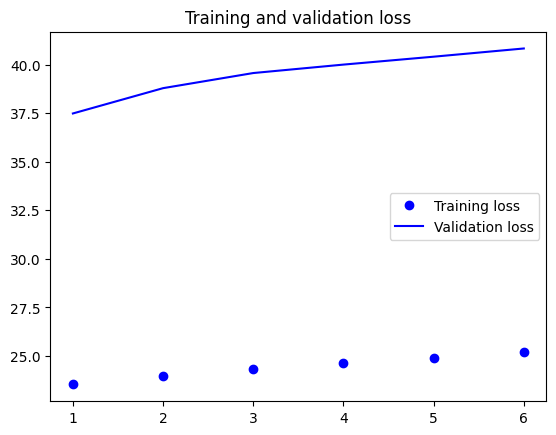

In [ ]:
epochs = range(1, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()

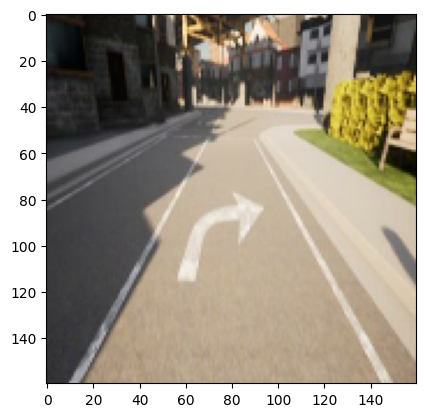

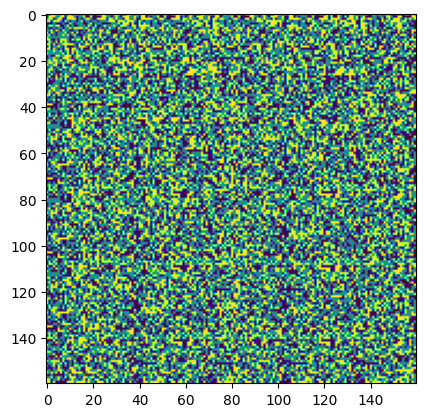

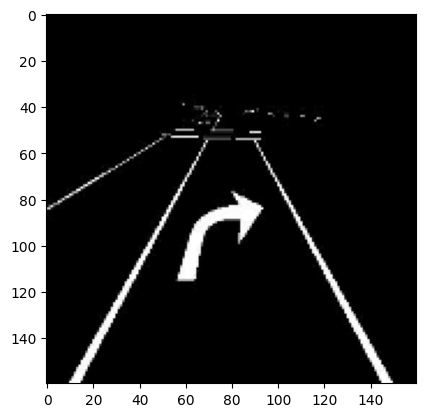

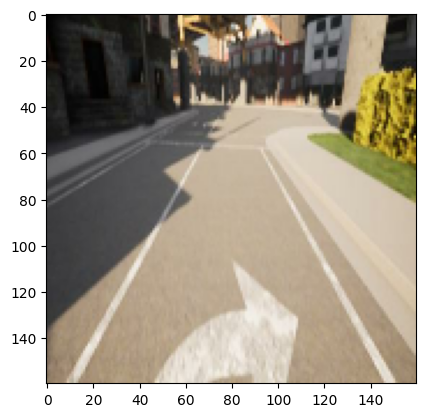

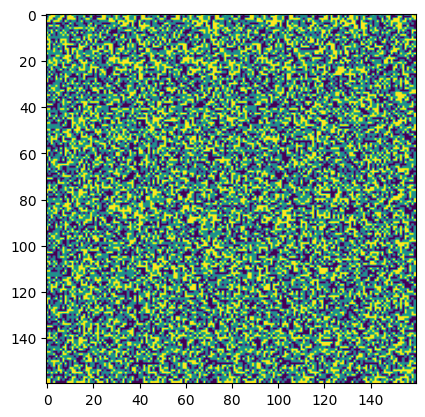

...

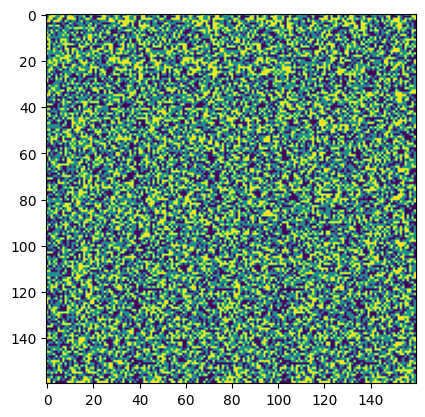

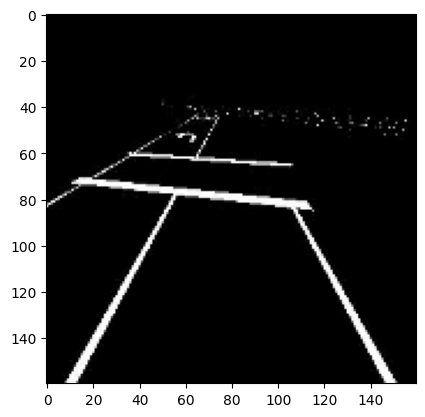

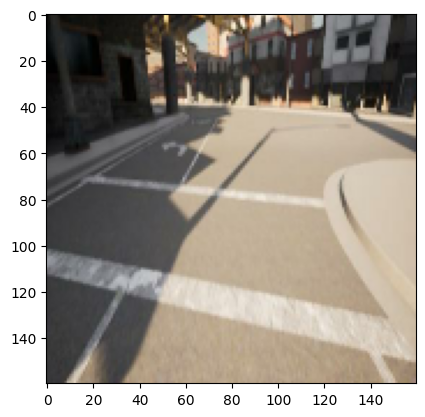

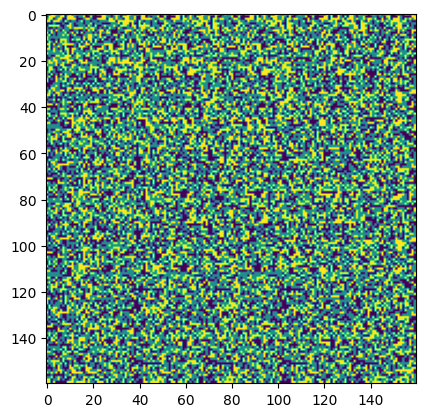

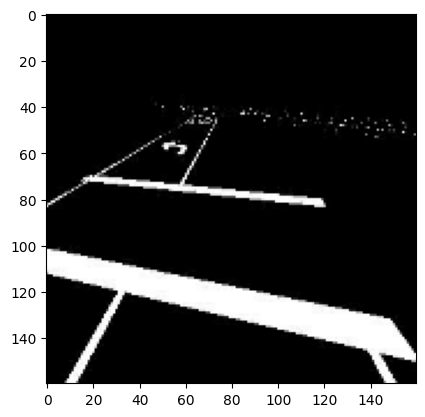

In [ ]:
import numpy as np


#load the checkpointed model
checkpoint_model=keras.models.load_model("lane_segmentation")

for x,y in val_ds.take(1):
  #use the model to predict pixel mask for the images in x
  preds = checkpoint_model.predict(x)

  #display the first five images in the batch together with their true mask and predicted mask
  for img,pred,true_mask in zip(x[:5],preds[:5],y[:5]):
    plt.imshow(tf.keras.utils.array_to_img(img))
    plt.show()

  #model's prediction for each image is of shape (160,160,3). The last axis holds the probability distribution over three pixel classes.
  #To display the output, we convert it to a single channel by taking the class with maximum predicted probability
    predicted_mask = np.argmax(pred, axis=-1)
  # shoe predicted mask
    plt.imshow(tf.keras.utils.array_to_img(tf.expand_dims(predicted_mask,-1)))
    plt.show()

  #show true mask
    plt.imshow(tf.keras.utils.array_to_img(true_mask))
    plt.show()


###Here we load the checkpointed model that was saved earlier and use it to predict the pixel mask for the images in the validation dataset. It then displays the first five images in the batch along with their true mask and predicted mask. For each image, the model's prediction is of shape (160,160,3), with the last axis holding the probability distribution over three pixel classes. The code converts the output to a single channel by taking the class with the maximum predicted probability. It then shows the predicted mask and the true mask for each image.

###Lets try with some other optimizer to see if we get any better results

###Since we tried with RMSprop , now lets try with Adam optimizer

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow import keras
from tensorflow.keras import layers

num_classes=3
x=layers.Conv2D(num_classes,kernel_size=(1,1), activation="relu", padding="same")(conv_base.output)
output=layers.Conv2DTranspose(num_classes,kernel_size=64,activation="softmax", strides=32, padding="same" )(x)
model_2 = keras.Model(conv_base.input, output)
model_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 166, 166, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 80, 80, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                            

In [ ]:
from tensorflow import keras
import tensorflow as tf
import math

train_size=5912
validation_size=1478
batch_size=64

#configuring and compiling the model

model_2.compile(optimizer="adam", loss="categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("lane_segmentation",save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, min_delta=1e-3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)
]

history = model_2.fit(
                    train_ds,
                    epochs=100,
                    validation_data=val_ds,
                    callbacks=callbacks,
                    )




Epoch 1/100
150/150 [==============================] - 52s 311ms/step - loss: 25.3178 - val_loss: 51.5950 - lr: 0.0010
Epoch 2/100
150/150 [==============================] - 11s 73ms/step - loss: 31.7306 - val_loss: 63.1787 - lr: 0.0010
Epoch 3/100
150/150 [==============================] - 11s 74ms/step - loss: 38.9843 - val_loss: 69.1623 - lr: 0.0010
Epoch 4/100
150/150 [==============================] - 11s 74ms/step - loss: 41.9539 - val_loss: 71.6712 - lr: 0.0010
Epoch 5/100
150/150 [==============================] - 11s 73ms/step - loss: 42.6654 - val_loss: 72.1620 - lr: 0.0010
Epoch 6/100
150/150 [==============================] - 11s 74ms/step - loss: 43.7268 - val_loss: 74.6150 - lr: 0.0010


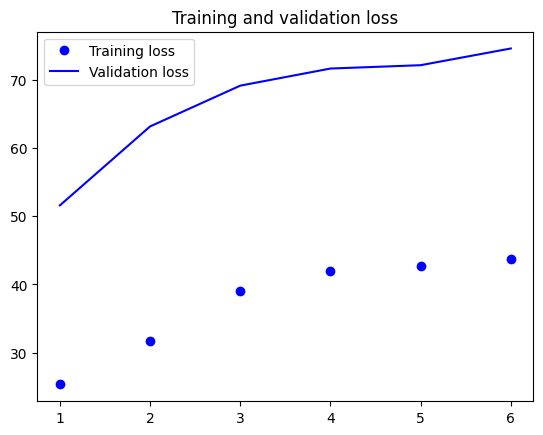

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()

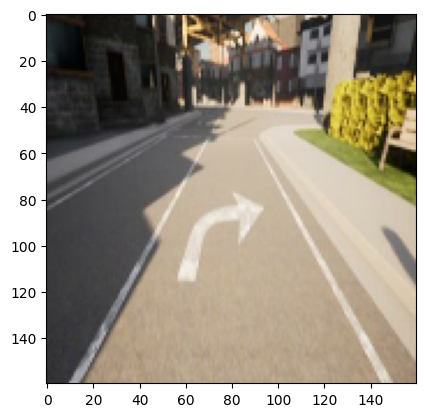

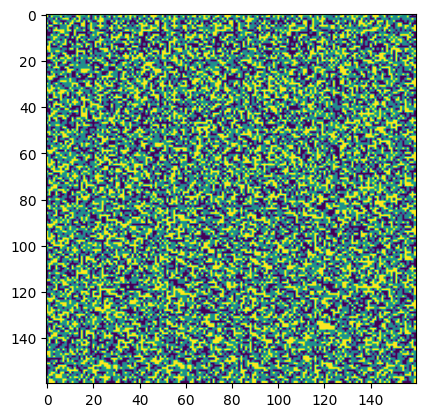

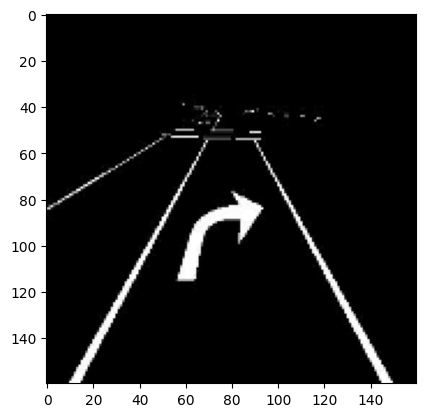

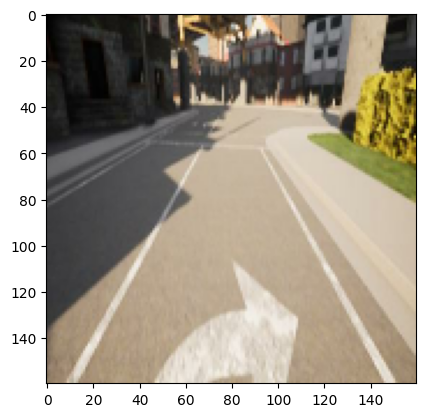

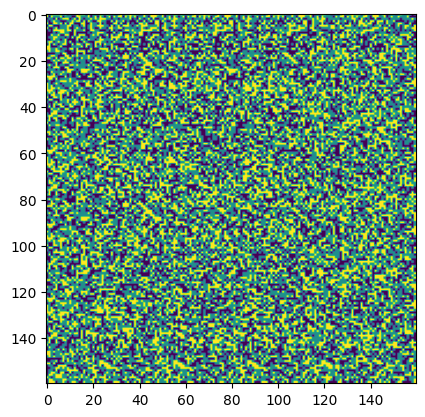

...

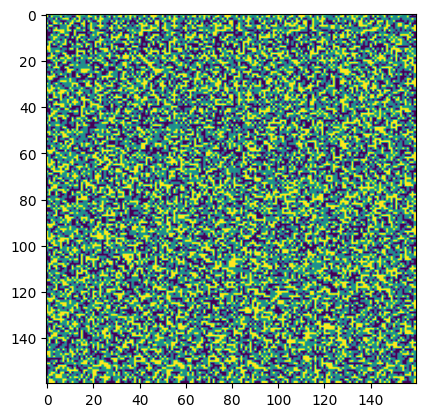

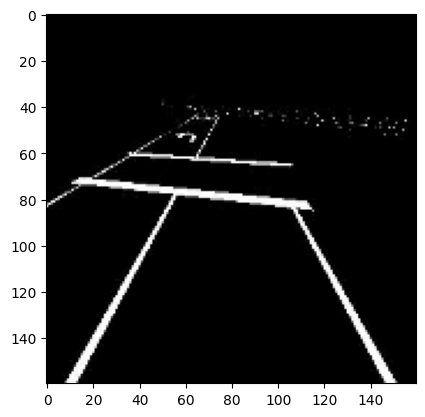

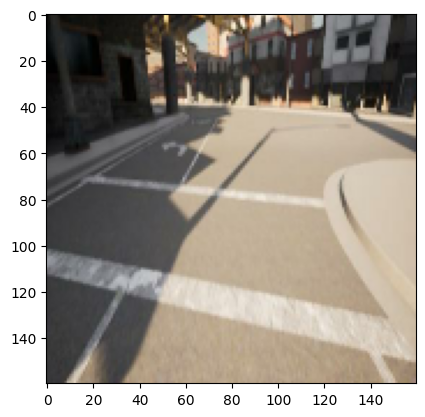

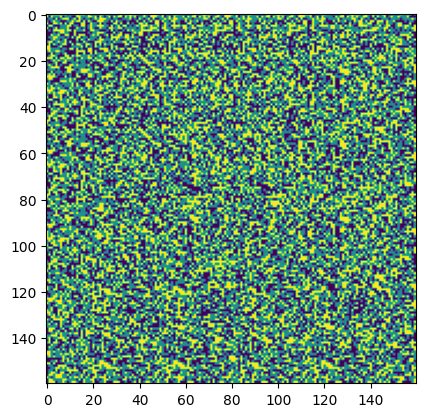

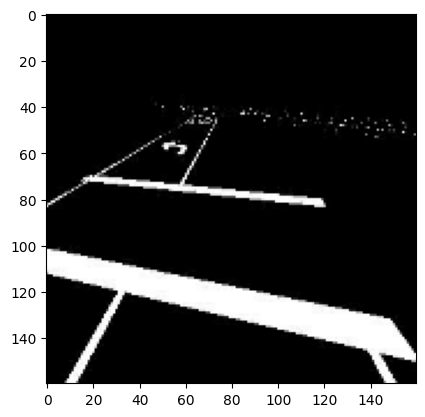

In [ ]:
import numpy as np


#load the checkpointed model
checkpoint_model2=keras.models.load_model("lane_segmentation")

for x,y in val_ds.take(1):
  #use the model to predict pixel mask for the images in x
  preds = checkpoint_model2.predict(x)

  #display the first five images in the batch together with their true mask and predicted mask
  for img,pred,true_mask in zip(x[:5],preds[:5],y[:5]):
    plt.imshow(tf.keras.utils.array_to_img(img))
    plt.show()

  #model's prediction for each image is of shape (180,180,3). The last axis holds the probability distribution over three pixel classes.
  #To display the output, we convert it to a single channel by taking the class with maximum predicted probability
    predicted_mask = np.argmax(pred, axis=-1)
  # shoe predicted mask
    plt.imshow(tf.keras.utils.array_to_img(tf.expand_dims(predicted_mask,-1)))
    plt.show()

  #show true mask
    plt.imshow(tf.keras.utils.array_to_img(true_mask))
    plt.show()




In [ ]:


#unfreez the convolution base
conv_base.trainable = True

#set trainable to False for all layers except the last 9 , that is freeze the weights for all layers except the last 9 layers
for layer in conv_base.layers[:-9]:
    layer.trainable=False

#set trainable to True for the convolutional layhers in the last 9 layers ( the last convolutional block in DENSENET121). That is unfreez the weights for the last 9 layers
for layer in conv_base.layers[-9:]:
    # we only want to unfreez the convolutional layers (batch normalizataion layers remain frozen)
    if layer.name.endswith("conv"):
      layer.trainable=True



model_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 166, 166, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 80, 80, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                            

In [ ]:
import tensorflow as tf
opt=tf.keras.optimizers.Adam(learning_rate=1e-4)
model_2.compile(optimizer=opt, loss="categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("lane_segmentation",save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, min_delta=1e-3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10)
]


history = model_2.fit(
                    train_ds,
                    epochs=100,
                    validation_data=val_ds,
                    callbacks=callbacks,
                    )


Epoch 1/100
150/150 [==============================] - 50s 299ms/step - loss: 28.1715 - val_loss: 46.9328 - lr: 1.0000e-04
Epoch 2/100
150/150 [==============================] - 11s 73ms/step - loss: 28.5778 - val_loss: 47.1243 - lr: 1.0000e-04
Epoch 3/100
150/150 [==============================] - 11s 74ms/step - loss: 29.0099 - val_loss: 47.5959 - lr: 1.0000e-04
Epoch 4/100
150/150 [==============================] - 11s 74ms/step - loss: 29.4821 - val_loss: 48.1690 - lr: 1.0000e-04
Epoch 5/100
150/150 [==============================] - 11s 72ms/step - loss: 29.9982 - val_loss: 48.8727 - lr: 1.0000e-04
Epoch 6/100
150/150 [==============================] - 11s 73ms/step - loss: 30.5571 - val_loss: 49.6903 - lr: 1.0000e-04


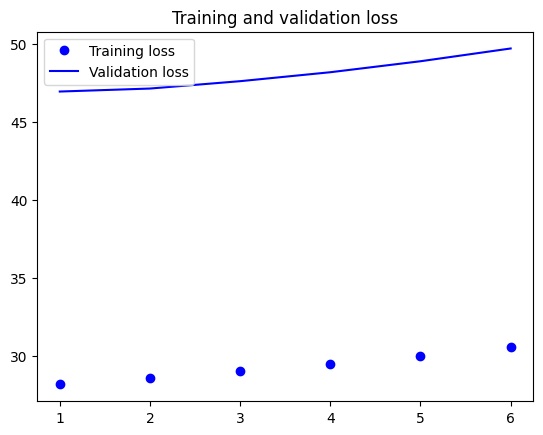

In [ ]:
epochs = range(1, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()

###As we can see from the results when we use the adam optimizer , before tuning the loss value was 74.61 but after fine - tuning the model we can observe a significant improvement to about 49.69 which is better than before tuning but slightly worse than RMSprop optimizer.

###Lets try using the Nadam optimizer to see if we get any changes in the results if the validation loss is less.

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow import keras
from tensorflow.keras import layers

num_classes=3
x=layers.Conv2D(num_classes,kernel_size=(1,1), activation="relu", padding="same")(conv_base.output)
output=layers.Conv2DTranspose(num_classes,kernel_size=64,activation="softmax", strides=32, padding="same" )(x)
model_3 = keras.Model(conv_base.input, output)
model_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 166, 166, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 80, 80, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                            

In [ ]:
from tensorflow import keras
import tensorflow as tf
import math

train_size=5912
validation_size=1478
batch_size=64

#configuring and compiling the model

model_3.compile(optimizer="nadam", loss="categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("oxford_segmentation",save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, min_delta=1e-3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)
]

history = model_3.fit(
                    train_ds,
                    epochs=100,
                    validation_data=val_ds,
                    callbacks=callbacks,
                    )




Epoch 1/100
150/150 [==============================] - 51s 299ms/step - loss: 27.0760 - val_loss: 48.8369 - lr: 0.0010
Epoch 2/100
150/150 [==============================] - 11s 74ms/step - loss: 34.5508 - val_loss: 63.6905 - lr: 0.0010
Epoch 3/100
150/150 [==============================] - 11s 74ms/step - loss: 41.7122 - val_loss: 71.8326 - lr: 0.0010
Epoch 4/100
150/150 [==============================] - 11s 75ms/step - loss: 44.5311 - val_loss: 73.8823 - lr: 0.0010
Epoch 5/100
150/150 [==============================] - 11s 74ms/step - loss: 45.6854 - val_loss: 76.1335 - lr: 0.0010
Epoch 6/100
150/150 [==============================] - 11s 75ms/step - loss: 46.9828 - val_loss: 78.7254 - lr: 0.0010


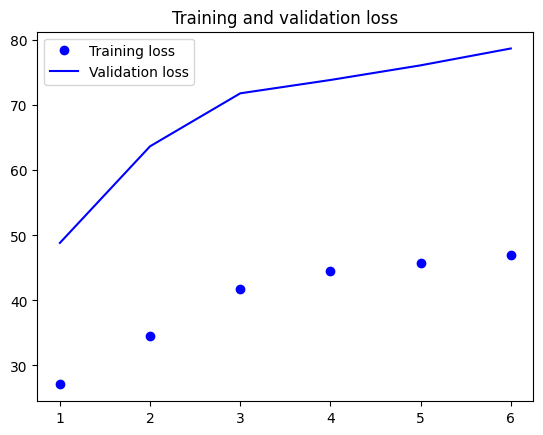

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()

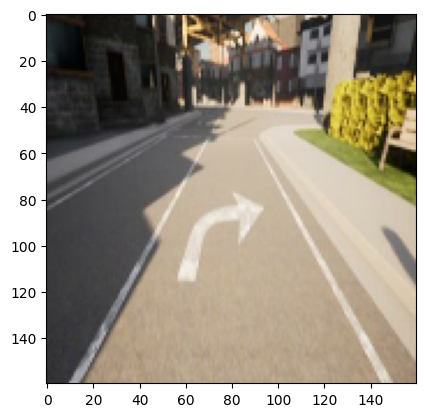

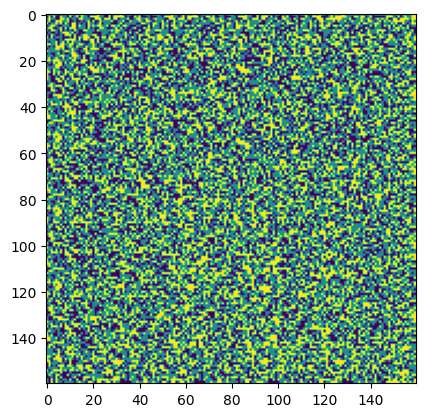

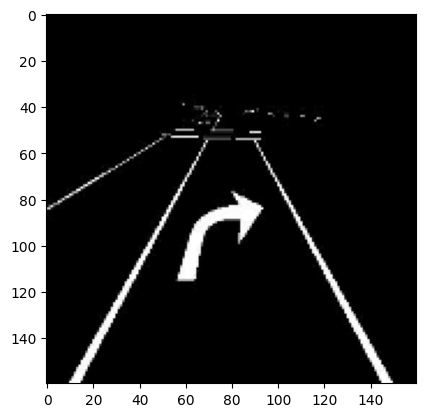

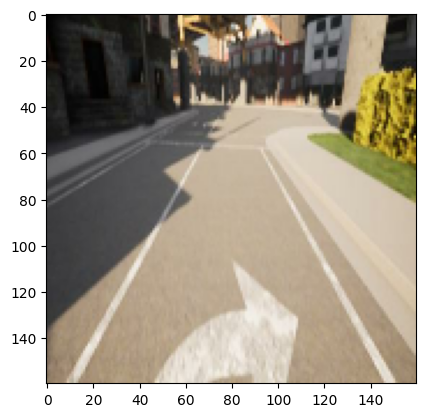

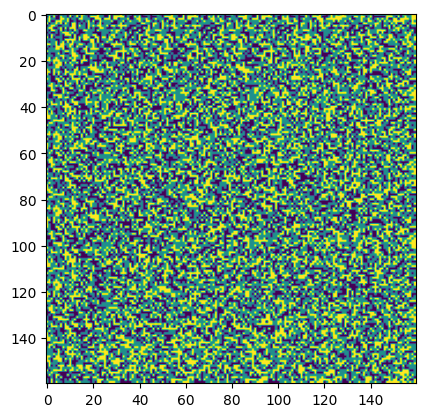

...

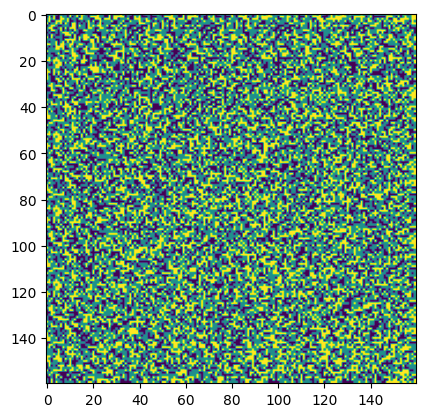

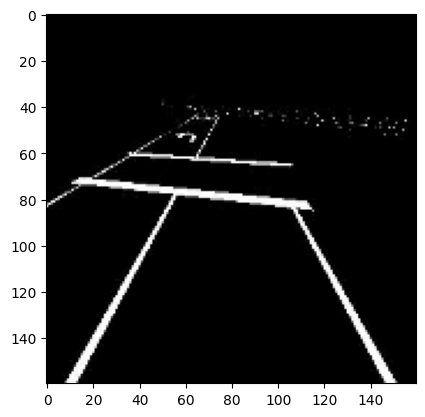

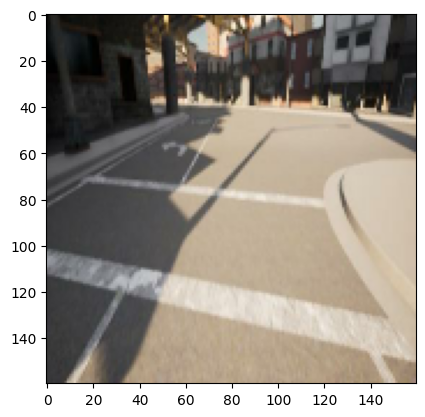

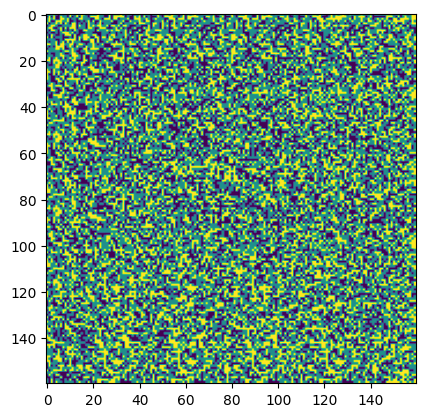

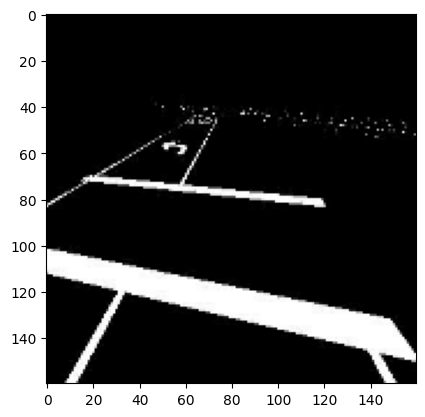

In [ ]:
import numpy as np


#load the checkpointed model
checkpoint_model3=keras.models.load_model("oxford_segmentation")

for x,y in val_ds.take(1):
  #use the model to predict pixel mask for the images in x
  preds = checkpoint_model3.predict(x)

  #display the first five images in the batch together with their true mask and predicted mask
  for img,pred,true_mask in zip(x[:5],preds[:5],y[:5]):
    plt.imshow(tf.keras.utils.array_to_img(img))
    plt.show()

  #model's prediction for each image is of shape (160,160,3). The last axis holds the probability distribution over three pixel classes.
  #To display the output, we convert it to a single channel by taking the class with maximum predicted probability
    predicted_mask = np.argmax(pred, axis=-1)
  # shoe predicted mask
    plt.imshow(tf.keras.utils.array_to_img(tf.expand_dims(predicted_mask,-1)))
    plt.show()

  #show true mask
    plt.imshow(tf.keras.utils.array_to_img(true_mask))
    plt.show()




In [ ]:


#unfreez the convolution base
conv_base.trainable = True

#set trainable to False for all layers except the last 9 , that is freeze the weights for all layers except the last 9 layers
for layer in conv_base.layers[:-9]:
    layer.trainable=False

#set trainable to True for the convolutional layhers in the last 9 layers ( the last convolutional block in DENSENET121). That is unfreez the weights for the last 9 layers
for layer in conv_base.layers[-9:]:
    # we only want to unfreez the convolutional layers (batch normalizataion layers remain frozen)
    if layer.name.endswith("conv"):
      layer.trainable=True



model_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 166, 166, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 80, 80, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                            

In [ ]:
import tensorflow as tf
opt=tf.keras.optimizers.Nadam(learning_rate=1e-4)
model_3.compile(optimizer=opt, loss="categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("lane_segmentation",save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, min_delta=1e-3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10)
]


history = model_3.fit(
                    train_ds,
                    epochs=100,
                    validation_data=val_ds,
                    callbacks=callbacks,
                    )


Epoch 1/100
150/150 [==============================] - 52s 310ms/step - loss: 29.9040 - val_loss: 48.6604 - lr: 1.0000e-04
Epoch 2/100
150/150 [==============================] - 11s 74ms/step - loss: 30.3462 - val_loss: 49.3304 - lr: 1.0000e-04
Epoch 3/100
150/150 [==============================] - 11s 75ms/step - loss: 30.8587 - val_loss: 50.0989 - lr: 1.0000e-04
Epoch 4/100
150/150 [==============================] - 11s 74ms/step - loss: 31.4286 - val_loss: 50.9640 - lr: 1.0000e-04
Epoch 5/100
150/150 [==============================] - 11s 73ms/step - loss: 32.0399 - val_loss: 51.9162 - lr: 1.0000e-04
Epoch 6/100
150/150 [==============================] - 11s 75ms/step - loss: 32.6806 - val_loss: 52.9289 - lr: 1.0000e-04


###From the above results the loss value before tuning was 78.72 which was wordt than adam optimizer but when the model is fine-tuned then the val_loss turns out to be 52.92. Hence, we can see a significant improvement i.e. the val_loss decreases but not as much when compared to RSMprop optimizer.

###Overall we can say that the fine-tuning did decrease the loss value for Nadam and Adam optimizer but when compared to RMSprop optimizer the loss value only increased but the increase was not that significant.